In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import tensorflow as tf
from sklearn.metrics import *

In [20]:
data = pd.read_csv("weatherHistory_shortened.csv")

In [21]:
data["date"] = np.zeros(len(data))
for i in range(len(data)):
    data["date"][i] = data["Formatted Date"][i][0:10]


data["time"] = np.zeros(len(data))
for i in range(len(data)):
    data["time"][i] = data["Formatted Date"][i][11:13]
    data["time"]

C:\Users\User\AppData\Local\Temp\ipykernel_13012\1854388789.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data["date"][i] = data["Formatted Date"][i][0:10]
C:\Users\User\AppData\Local\Temp\ipykernel_13012\1854388789.py:3: SettingWithCo

In [22]:
import datetime
data["nth_day"] = np.zeros(len(data))
for i in range(len(data)):
    datetime.datetime.strptime(data["date"][i] ,'%Y-%m-%d')
    data["nth_day"][i] = datetime.datetime.strptime(data["date"][i],'%Y-%m-%d').timetuple().tm_yday
    data["nth_day"] = data["nth_day"].to_numpy(int)

data["nth_day"]

C:\Users\User\AppData\Local\Temp\ipykernel_13012\334974672.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data["nth_day"][i] = datetime.datetime.strptime(data["date"][i],'%Y-%m-%d').timetuple().tm_yday
C:\Users\User\AppData\Local\Temp\i

0        91
1        91
2        91
3        91
4        91
       ... 
8779    252
8780    252
8781    252
8782    252
8783    252
Name: nth_day, Length: 8784, dtype: int32

In [31]:
data['Date_new'] = pd.to_datetime(data['Formatted Date'], yearfirst=True)
data['Date_in_Days'] = data['Date_new'].map(lambda date:f'{30*(date.month-1) + date.day}') 
data['Date_in_Days'] = data['Date_in_Days'].to_numpy(dtype=int)
data.head(3)

C:\Users\User\AppData\Local\Temp\ipykernel_13012\4003766767.py:1: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  data['Date_new'] = pd.to_datetime(data['Formatted Date'], yearfirst=True)


,index,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary,date,time,nth_day,Date_new,Date_in_Days,Average temperature
0,2902,2006-01-01 22:00:00.000 +0100,Overcast,rain,5.472222,1.377778,0.87,22.7171,149,14.7959,0,1009.51,Mostly cloudy throughout the day.,2006-01-01,22,1,2006-01-01 22:00:00+01:00,1,5.472222
1,2901,2006-01-01 21:00:00.000 +0100,Overcast,rain,4.933333,0.555556,0.86,23.9407,139,15.7297,0,1009.43,Mostly cloudy throughout the day.,2006-01-01,21,1,2006-01-01 21:00:00+01:00,1,4.933333
2,2900,2006-01-01 20:00:00.000 +0100,Overcast,rain,5.972222,1.861111,0.80,24.2305,140,11.2700,0,1009.39,Mostly cloudy throughout the day.,2006-01-01,20,1,2006-01-01 20:00:00+01:00,1,5.972222


In [32]:
data['date'] = pd.to_datetime(data['date'], yearfirst=True)
data['date']

0      2006-01-01
1      2006-01-01
2      2006-01-01
3      2006-01-01
4      2006-01-01
          ...    
8779   2010-08-02
8780   2010-08-02
8781   2010-08-02
8782   2010-08-02
8783   2010-08-02
Name: date, Length: 8784, dtype: datetime64[ns]

In [33]:
data = data.sort_values(by=['date'], ascending=True).reset_index()
data.head(3)

,level_0,index,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary,date,time,nth_day,Date_new,Date_in_Days,Average temperature
0,0,2902,2006-01-01 22:00:00.000 +0100,Overcast,rain,5.472222,1.377778,0.87,22.7171,149,14.7959,0,1009.51,Mostly cloudy throughout the day.,2006-01-01,22,1,2006-01-01 22:00:00+01:00,1,5.472222
1,23,2880,2006-01-01 00:00:00.000 +0100,Partly Cloudy,rain,0.577778,-4.050000,0.89,17.1143,140,9.9820,0,1016.66,Mostly cloudy throughout the day.,2006-01-01,00,1,2006-01-01 00:00:00+01:00,1,0.577778
2,22,2903,2006-01-01 23:00:00.000 +0100,Overcast,rain,5.422222,1.666667,0.86,19.5615,148,15.6492,0,1009.64,Mostly cloudy throughout the day.,2006-01-01,23,1,2006-01-01 23:00:00+01:00,1,5.422222


In [34]:
data = data.copy()
data["Average temperature"] = data["Temperature (C)"]
data.groupby("nth_day")["Average temperature"].mean().reset_index()

,nth_day,Average temperature
0,1,3.873148
1,2,5.418519
2,3,2.319444
3,4,2.274074
4,5,2.698148
...,...,...
360,361,-2.033796
361,362,-4.684491
362,363,-1.553704
363,364,-1.741435


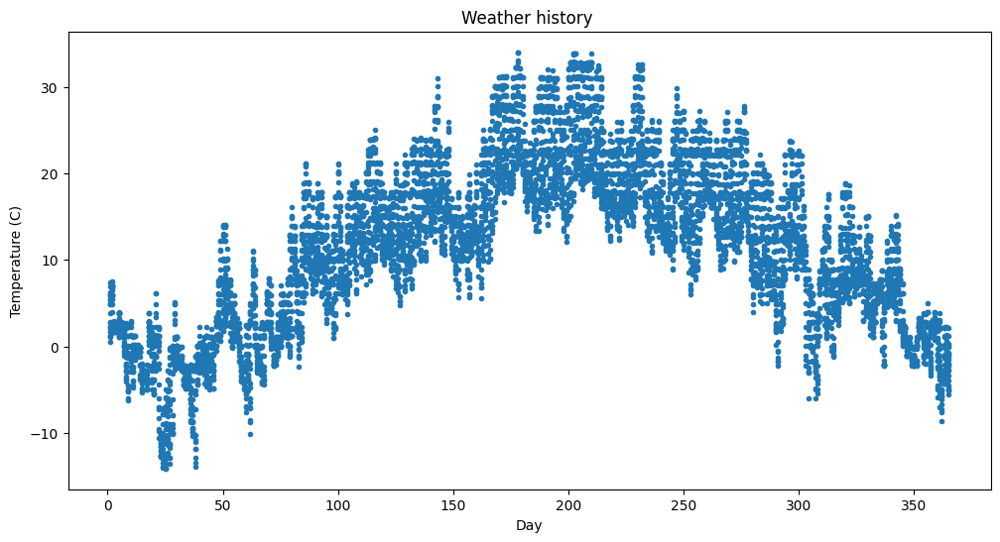

In [72]:
plt.figure(figsize=(12,6))

plt.scatter(data['nth_day'].to_numpy(), data['Average temperature'].to_numpy(), marker='.')
plt.title("Weather history ")
plt.xlabel("Day")
plt.ylabel("Temperature (C)")
plt.show()

In [95]:
X = data["nth_day"].copy().values
Y = data["Average temperature"].copy().values

# Split the data into training and test sets
X_train, X_valid, Y_train, Y_valid = train_test_split(X, Y, test_size=0.2)
X_train = X_train.reshape(-1,1)
X_valid = X_valid.reshape(-1,1) 
Y_train = Y_train.reshape(-1,1)
Y_valid = Y_valid.reshape(-1,1)
X_train.shape, X_valid.shape, Y_train.shape, Y_valid.shape

((7027, 1), (1757, 1), (7027, 1), (1757, 1))

In [97]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(1 , activation="sigmoid"),
    tf.keras.layers.Dense(64 , activation="relu"),
    tf.keras.layers.Dense(32 , activation="relu"),
    tf.keras.layers.Dense(16 , activation="relu"),
    tf.keras.layers.Dense(8 , activation=tf.keras.layers.LeakyReLU()),
    tf.keras.layers.Dense(1, activation="linear")   # because it is a regression problem
])

In [98]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='mse')

In [99]:
output = model.fit(X_train, Y_train, epochs=50)

Epoch 1/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 169.8308
Epoch 2/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 93.8730
Epoch 3/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 90.5456
Epoch 4/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 83.5418
Epoch 5/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53.4921
Epoch 6/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53.8839
Epoch 7/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 54.6156
Epoch 8/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 55.3480
Epoch 9/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 54.0719
Epoch 10/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53.4654
Epoch 11/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 52.5572
Epoch 12/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53.4682
Epoch 13/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53.8627
Epoch 14/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 52.3017
Epoch 15/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 0

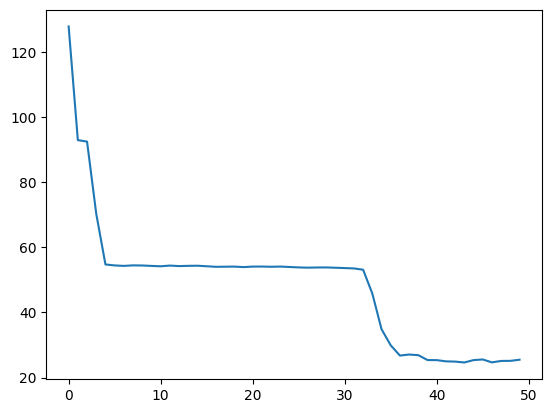

In [101]:
plt.plot(output.history["loss"])
plt.show()

In [102]:
model.evaluate(X_valid, Y_valid)

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 22.5793


23.009929656982422

In [103]:
y_pred = model.predict(X_valid)

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [104]:
print("Regression metrics:")
print("MSE = ",mean_squared_error(Y_valid, y_pred))
print("R2 = ",r2_score(Y_valid, y_pred))

Regression metrics:
MSE =  23.009649637169396
R2 =  0.743542270945032


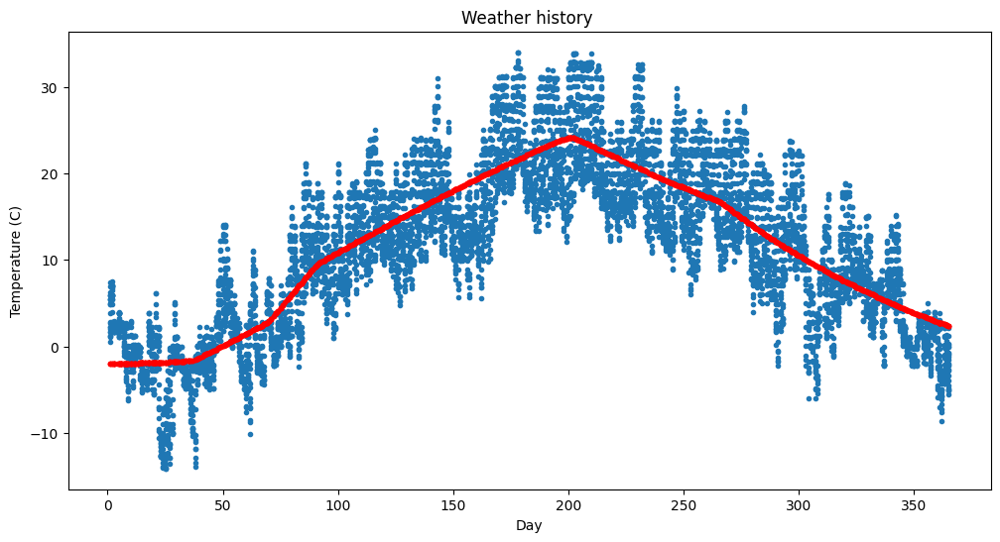

In [105]:
plt.figure(figsize=(12,6))

plt.scatter(data['nth_day'].to_numpy(), data['Average temperature'].to_numpy(), marker='.')
plt.plot(X_valid , y_pred, ".", c='red')
plt.title("Weather history ")
plt.xlabel("Day")
plt.ylabel("Temperature (C)")
plt.show()